# Exploratory Data Analysis

In [109]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

In [110]:
# Load in cleaned data
train = pd.read_csv('../datasets/train_clean.csv')
test = pd.read_csv('../datasets/test_clean.csv')
pd.set_option('display.max_columns', None)
style.use('seaborn-whitegrid')

### Examining Sale Price

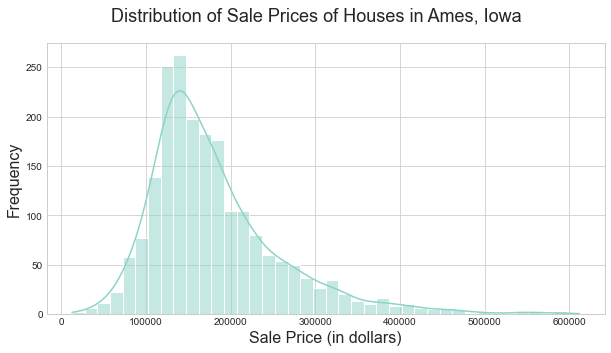

In [111]:
# Sale price exhibits right skew and is not normally distributed. 
fig = plt.figure(figsize=(10,5))
sns.histplot(train['saleprice'], bins=40, kde=True)
fig.suptitle('Distribution of Sale Prices of Houses in Ames, Iowa', fontsize=18)
plt.xlabel('Sale Price (in dollars)', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.savefig('../images/saleprice_before.png', bbox_inches='tight', facecolor='w')
plt.show()

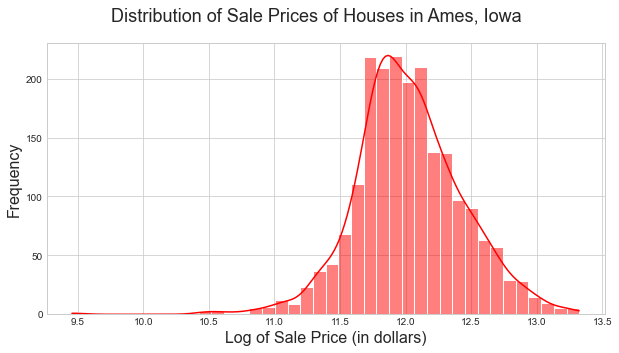

In [112]:
# We apply a Log transformation to normalise the variable and remove outliers. 
fig = plt.figure(figsize=(10,5))
sns.histplot(np.log(train['saleprice']), bins=40, kde=True, color='r')
fig.suptitle('Distribution of Sale Prices of Houses in Ames, Iowa', fontsize=18)
plt.xlabel('Log of Sale Price (in dollars)', fontsize=16)
plt.ylabel('Frequency', fontsize=16)
plt.savefig('../images/saleprice_after.png', bbox_inches='tight', facecolor='w')
plt.show()

In [113]:
train['logsaleprice'] = np.log(train['saleprice'])

### Examining Correlation

In [114]:
# Find most correlated variables with logsaleprice
corr_df = train.corr()[['logsaleprice']]

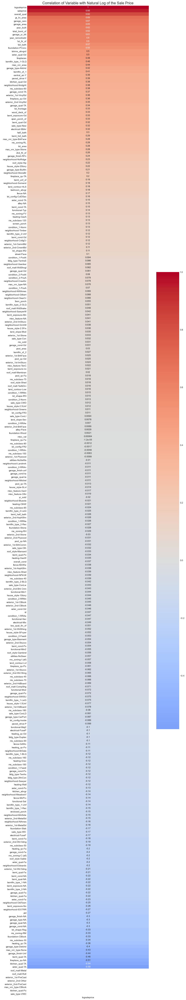

In [115]:
# There are some very highly correlated variables with log sale price, which bode well for predicting sale price and answering the problem statement.
fig = plt.figure(figsize=(12,80))
sns.heatmap(corr_df.sort_values('logsaleprice',ascending=False),annot=True, cmap='coolwarm', center=0)
plt.title('Correlation of Variable with Natural Log of the Sale Price', fontsize=16);

In [116]:
# Most important variables
corr_df[abs(corr_df['logsaleprice'])>0.5].T.columns.to_list()

['overall_qual',
 'year_built',
 'year_remod/add',
 'total_bsmt_sf',
 '1st_flr_sf',
 'gr_liv_area',
 'full_bath',
 'garage_yr_blt',
 'garage_cars',
 'garage_area',
 'saleprice',
 'exter_qual-TA',
 'foundation-PConc',
 'kitchen_qual-TA',
 'fireplace_qu-NA',
 'logsaleprice']

In [117]:
# Dropping variables with no variation in train set
null_vars = corr_df[abs(corr_df['logsaleprice']).isnull()].T.columns.to_list()

In [118]:
train.drop(columns=null_vars, inplace=True)

In [119]:
test.drop(columns=null_vars, inplace=True)

In [120]:
# Moving logsaleprice to first variable
col = train.pop('logsaleprice')
train.insert(0, col.name, col)

### Examining Numerical Variables

In [121]:
non_dummy = train.columns[~train.columns.str.contains('-')].to_list()
non_dummy_df = train.loc[:, non_dummy]

In [122]:
# Looking at summary statistics of numerical variables
non_dummy_df.describe()

,logsaleprice,id,pid,lot_frontage,lot_area,overall_qual,overall_cond,year_built,year_remod/add,mas_vnr_area,bsmtfin_sf_1,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,totrms_abvgrd,fireplaces,garage_yr_blt,garage_cars,garage_area,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,misc_val,mo_sold,yr_sold,saleprice
count,2051.000000,2051.000000,2.051000e+03,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000,2051.000000
mean,12.024397,1474.033642,7.135900e+08,69.739186,10065.208191,6.112140,5.562165,1971.708922,1984.190151,98.626524,442.084837,47.935641,567.451487,1057.471965,1164.488055,329.329108,5.512921,1499.330083,0.427109,0.063384,1.577279,0.371039,2.843491,1.042906,6.435885,0.590931,1976.610434,1.775719,473.440761,93.833740,47.556802,22.571916,2.591419,16.511458,2.397855,51.574354,6.219893,2007.775719,181469.701609
std,0.411316,843.980841,1.886918e+08,23.193681,6742.488909,1.426271,1.104497,30.177889,21.036250,174.324690,461.195041,164.964052,445.022846,449.908003,396.446923,425.671046,51.068870,500.447829,0.522589,0.251590,0.549279,0.501043,0.826618,0.209790,1.560225,0.638516,26.615416,0.765357,216.135102,128.549416,66.747241,59.845110,25.229615,57.374204,37.782570,573.393985,2.744736,1.312014,79258.659352
min,9.456341,1.000000,5.263011e+08,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1872.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,11.773943,753.500000,5.284581e+08,59.000000,7500.000000,5.000000,5.000000,1953.500000,1964.500000,0.000000,0.000000,0.000000,220.000000,793.000000,879.500000,0.000000,0.000000,1129.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1959.000000,1.000000,319.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129825.000000
50%,11.998433,1486.000000,5.354532e+08,69.000000,9430.000000,6.000000,5.000000,1974.000000,1993.000000,0.000000,368.000000,0.000000,474.000000,994.000000,1093.000000,0.000000,0.000000,1444.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,480.000000,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,162500.000000
75%,12.273731,2198.000000,9.071801e+08,80.000000,11513.500000,7.000000,6.000000,2001.000000,2004.000000,159.000000,733.500000,0.000000,811.000000,1318.500000,1405.000000,692.500000,0.000000,1728.500000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,13.323927,2930.000000,9.241520e+08,313.000000,159000.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,5095.000000,1862.000000,1064.000000,5642.000000,3.000000,2.000000,4.000000,2.000000,8.000000,3.000000,15.000000,4.000000,2010.000000,5.000000,1418.000000,1424.000000,547.000000,432.000000,508.000000,490.000000,800.000000,17000.000000,12.000000,2010.000000,611657.000000


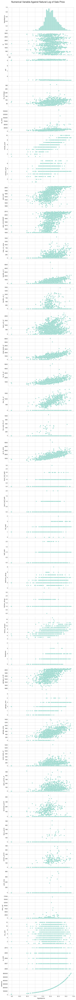

In [123]:
# We can see some correlations but there does not appear to be any polynomial relationships. Given the abundance of variables, there is already likely to be overfitting in our model. We thus choose not to create more variables through polynomial features or interactions. 
g = sns.pairplot(data=non_dummy_df, x_vars=['logsaleprice'], aspect=3)
g.fig.suptitle('Numerical Variable Against Natural Log of Sale Price', fontsize=16,  y=0.995);

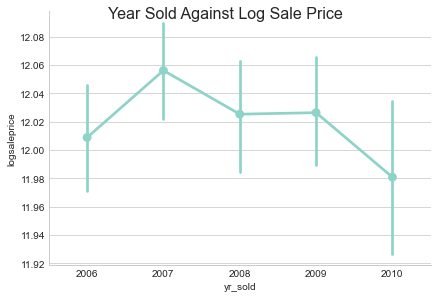

In [124]:
# Taking a closer look at year sold, the trend varies from year to year, likely due to the 2008 subprime mortgage crisis. 
g = sns.catplot(data=train, x='yr_sold', y='logsaleprice', kind="point", height=4, aspect=1.5)
g.fig.suptitle('Year Sold Against Log Sale Price', fontsize=16);
plt.savefig('../images/year_sold.png', bbox_inches='tight', facecolor='w')
plt.show()

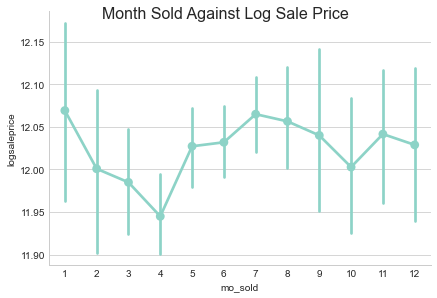

In [125]:
# Similarly, taking a look at month sold, there is no clear trend, with a curious drop in prices in the spring. This indicates to me that year and month should be dummified.
g = sns.catplot(data=train, x='mo_sold', y='logsaleprice', kind="point", height=4, aspect=1.5)
g.fig.suptitle('Month Sold Against Log Sale Price', fontsize=16);
plt.savefig('../images/month_sold.png', bbox_inches='tight', facecolor='w')
plt.show()

In [126]:
# Dummifying for train and test set
train = pd.get_dummies(train, columns = ['yr_sold', 'mo_sold'], drop_first=True, prefix_sep='-')
test = pd.get_dummies(test, columns = ['yr_sold', 'mo_sold'], drop_first=True, prefix_sep='-')

In [127]:
# Save in finalised data for modeling
train.to_csv('../datasets/train_clean_final.csv', index=False)
test.to_csv('../datasets/test_clean_final.csv', index=False)